# In this model we want to do the following:
- Model the white light curve for both visits
- Use fit results to fix the ramp and breathing parameters

In [1]:
from preamble_jax import *

Available devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7), CpuDevice(id=8), CpuDevice(id=9), CpuDevice(id=10), CpuDevice(id=11)]
CPU devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7), CpuDevice(id=8), CpuDevice(id=9), CpuDevice(id=10), CpuDevice(id=11)]


2025-11-16 16:44:09,474 - WARNING - File .dacerc not found. You are requesting data in public mode. To change this behaviour, create a .dacerc file in your home directory and fill it with your API key. More infos on https://dace.unige.ch


🌈🤖 It looks like you're trying to bin in wavelength for a
`Rainbow` object that might not be normalized. In the
current version of `chromatic`, binning before normalizing
might give inaccurate results if the typical uncertainty
varies strongly with wavelength.

Please consider normalizing first, for example with
`rainbow.normalize().bin(...)`
so that all uncertainties will effectively be relative,
and the inverse variance weighting used for binning
wavelengths together will give more reasonable answers.

If you really need to bin before normalizing, please submit
an Issue at github.com/zkbt/chromatic/, and we'll try to
prioritize implementing a statistically sound solution as
soon as possible!



  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/160 [00:00<?, ?it/s]

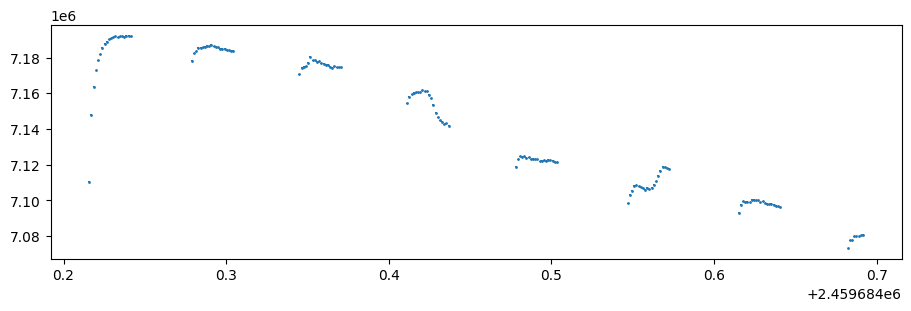

<Figure size 640x480 with 0 Axes>

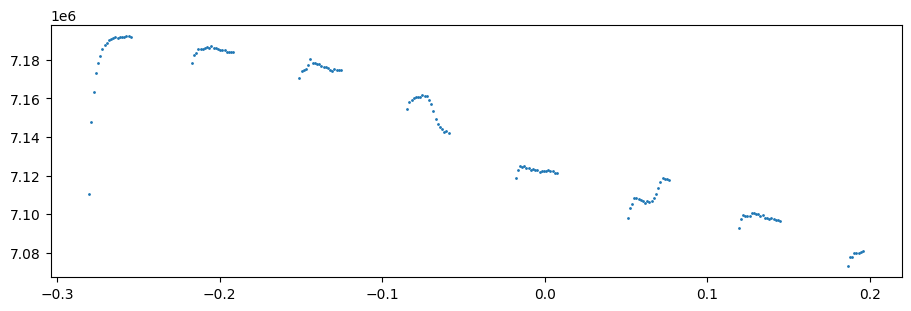

<Figure size 640x480 with 0 Axes>

In [2]:
visit = 'S22'

orbits_to_exclude = np.array([0,2])
err_factor = F21_SED_err_factor if visit=='F21' else S22_SED_err_factor
lc_index = 1 if visit=='F21' else 0
bin_edges = jnp.array([0.86,1.138,1.645]) * u.micron

predicted_T0 = visits[f'{visit}']['T0 (BJD_TDB)'].value
binwidth = visits[f'{visit}']['native resolution']
exptime = visits[f'{visit}']['exp (s)']
grism = visits[f'{visit}']['Grism']

rainbow = read_rainbow(f'../data/{visit}_scan-combined_trimmed_pacman_spec.rainbow.npy')
speclc_rainbow = rainbow
binned_for_model = rainbow.bin(wavelength_edges=bin_edges)
fleck_wavelengths = binned_for_model.wavelength.value

'Adjust uncertainties and bin the rainbow'
for i in range(len(rainbow.wavelength.value)):
    speclc_rainbow.uncertainty[i,:] = rainbow.uncertainty[i,:] * err_factor[i]

trimmed_rainbow = speclc_rainbow.get_average_lightcurve_as_rainbow()

trimmed_rainbow.time[-12:] = np.nan
# trimmed_rainbow.time[1:12] = np.nan

plt.figure(figsize=(9,3))
plt.errorbar(trimmed_rainbow.time,trimmed_rainbow.flux.flatten(),trimmed_rainbow.uncertainty.flatten(),
            fmt='o',ms=1)
plt.show()
plt.clf()

data_wavelengths = speclc_rainbow.wavelength.value
img_date = trimmed_rainbow.time.value
data_flux = trimmed_rainbow.flux.flatten().value
relative_err = trimmed_rainbow.uncertainty.flatten().value/data_flux
time_from_T0 = img_date - predicted_T0

plt.figure(figsize=(9,3) )
plt.errorbar(time_from_T0,data_flux,yerr=relative_err,fmt='o',ms=1)
plt.show()
plt.clf()

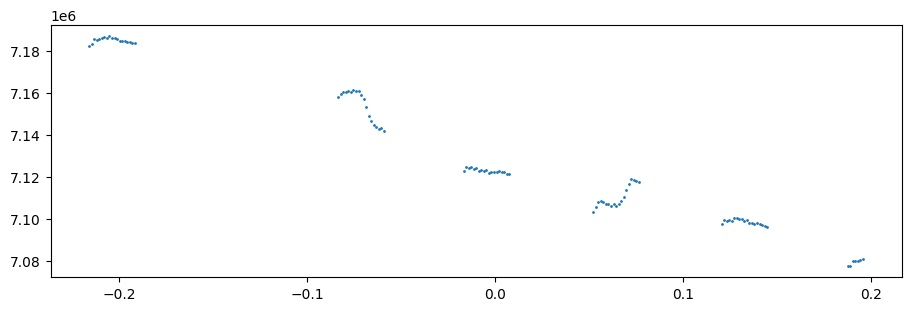

<Figure size 640x480 with 0 Axes>

In [3]:
# Label the orbits
orbit = np.zeros_like(img_date)
for j in range(len(img_date)):
    if j >= 1:
        if (img_date[j] - img_date[j - 1]) > 0.01:
            orbit[j] = (orbit[j - 1] + 1)
        else:
            orbit[j] = orbit[j - 1]

# Trim the first point from each orbit
ref_time = []
for o in np.unique(orbit):
    first_index = np.where(orbit == o)[0][0]
    ref_time.append(img_date[first_index])
    data_flux[first_index] = np.nan  # Set the first point of each subsequent orbit to np.nan
    relative_err[first_index] = np.nan
    img_date[first_index] = np.nan
    time_from_T0[first_index] = np.nan

# Set data to nan if it was in the pre-defined list of orbits to exclude
for orbit_to_exclude in orbits_to_exclude:
    data_flux[orbit == orbit_to_exclude] = np.nan
    relative_err[orbit == orbit_to_exclude] = np.nan
    img_date[orbit == orbit_to_exclude] = np.nan
    time_from_T0[orbit == orbit_to_exclude] = np.nan

plt.figure(figsize=(9,3) )
plt.errorbar(time_from_T0,data_flux,yerr=relative_err,fmt='o',ms=1)
plt.show()
plt.clf()

# Populate ramp_phase time arrays
phase_list=[]
for o in [0,1,2,3,4,5,6,7]:
    rphase = (img_date[orbit==o] - ref_time[o]) / 0.066
    phase_list.append(rphase)
ramp_phase = np.concatenate(phase_list)
breathing_phase = ( (img_date-ref_time[0]+0.02) / 0.066 ) % 1

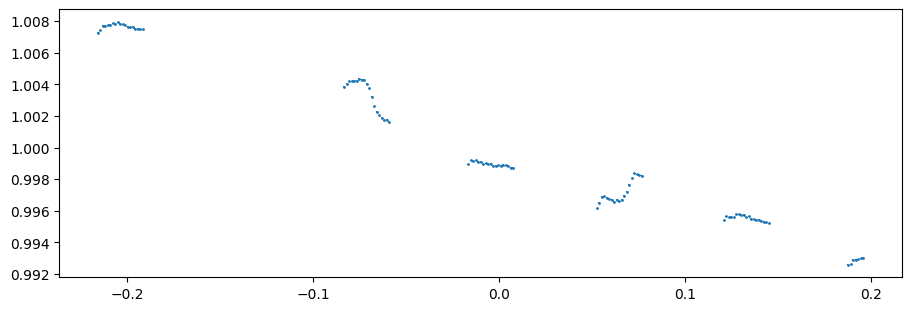

<Figure size 640x480 with 0 Axes>

In [4]:
# Convert all arrays to JAX arrays
_data_flux = jnp.array( data_flux[~np.isnan(time_from_T0)] )
data_flux = _data_flux[~jnp.isnan(_data_flux)]
_relative_err = jnp.array(relative_err[~np.isnan(time_from_T0)] )
relative_err = _relative_err[~jnp.isnan(_data_flux)]
_img_date = jnp.array(img_date[~np.isnan(time_from_T0)] )
img_date = _img_date[~jnp.isnan(_data_flux)]
_time_from_T0 = jnp.array(time_from_T0[~np.isnan(time_from_T0)] )
time_from_T0 = _time_from_T0[~jnp.isnan(_data_flux)]
_ramp_phase = jnp.array(ramp_phase[~np.isnan(ramp_phase)] )
ramp_phase = _ramp_phase[~jnp.isnan(_data_flux)]
_breathing_phase = jnp.array(breathing_phase[~np.isnan(breathing_phase)] )
breathing_phase = _breathing_phase[~jnp.isnan(_data_flux)]

normalized_data_flux = data_flux/jnp.mean(data_flux)
normalized_relative_err = relative_err*normalized_data_flux

plt.figure(figsize=(9,3) )
plt.errorbar(time_from_T0,normalized_data_flux,yerr=normalized_relative_err,fmt='o',ms=1)
plt.show()
plt.clf()

In [5]:
def read_spots_from_file(filename):
    """
    Read spot coordinates from a file.
    
    Parameters:
    - filename: input filename
    
    Returns:
    - latitudes, longitudes in radians
    - metadata dictionary
    """
    latitudes = []
    longitudes = []
    metadata = {}
    
    with open(filename, 'r') as f:
        for line in f:
            line = line.strip()
            
            # Skip empty lines and comments
            if not line or line.startswith('#'):
                # Extract metadata from comments
                if line.startswith('#') and ':' in line:
                    key_value = line[1:].split(':', 1)
                    if len(key_value) == 2:
                        key = key_value[0].strip()
                        value = key_value[1].strip()
                        metadata[key] = value
                continue
            
            # Parse data lines
            parts = line.split()
            if len(parts) >= 2:
                try:
                    lat = float(parts[0])
                    lon = float(parts[1])
                    latitudes.append(lat)
                    longitudes.append(lon)
                except ValueError:
                    continue
    
    latitudes = np.array(latitudes)
    longitudes = np.array(longitudes)
    
    return latitudes, longitudes, metadata

In [6]:
default_params={

    # Ramp Model Parameters
    'r_1': 18.1,
    'r_2': -6.7,
    'r_3': 0.0135,
    #Breathing params
    'b_1':0,
    'b_2':0,
    'b_3':0,
    'b_4':0,
    
    # Planet parameters
    'Mp':8.0,
    'i_planet':89.5,
    'P_orb':8.463,
    't_0':0.00055,
    'rp_rstar': 0.0465,
    'a_rstar': 19.15,
    'ecc': 0.0,
    'u_1':0.35,
    'u_2':0.15,
    
    # Stellar parameters
    'log_g':4.5,
    'i_star':89.5,
    'P_rot':4.86,
    'Rs':0.8,
    'Ms':0.6,
    'metallicity':0.0,

    # Spot Parameters
    'log_fixedspot_radii':-1.6,
    'T_unocculted': 3100,
    'T_occulted': 3500,
    'T_phot': 4200,
    'T_spot': 3550,
    'limb_spot_lon':-1.305,
    'limb_spot_lat':1.2,
    'limb_spot_rad':0.22,
    'chord_spot_lon_1':0.05,
    'chord_spot_lat_1':1.54,
    'chord_spot_rad_1':0.15,
    'chord_spot_lon_2':0.86,
    'chord_spot_lat_2':1.66,
    'chord_spot_rad_2':0.055,

    # Model meta-parameters
    'beta':0.25,
}

latitudes_read, longitudes_read, file_metadata = read_spots_from_file('star_spots_radians.txt')
initial_lats = jnp.array(latitudes_read)
initial_lons = jnp.array(longitudes_read)

In [7]:
def numpyro_model():

    """
    Define the probabilistic model in NUMPYRO
    """
    params = {}

    # Instrument Parameters
    params['r_1'] = numpyro.sample('r_1', dist.Uniform(8.0, 18.0))
    params['r_2'] = numpyro.sample('r_2', dist.Uniform(-7.2, -5.8))
    params['r_3'] = numpyro.sample('r_3', dist.Uniform(0.005,0.03))

    # Instrument Parameters
    params['b_1'] = numpyro.sample('b_1', dist.Uniform(-0.5,0.5))
    params['b_2'] = numpyro.sample('b_2', dist.Uniform(-0.5,0.5))
    params['b_3'] = numpyro.sample('b_3', dist.Uniform(-0.5,0.5))
    params['b_4'] = numpyro.sample('b_4', dist.Uniform(-0.5,0.5))

    # Planet Parameters
    params['rp_rstar'] = numpyro.sample('rp_rstar', dist.Uniform(0.044, 0.049))
    params['t_0'] = 0.00055#numpyro.sample('t_0', dist.Uniform(0.0, 0.001)) 
    params['a_rstar'] = 19.15 #numpyro.sample('a', dist.Uniform(18.0, 20.0))
    
    params['u_1'] = numpyro.sample('u_1', dist.Uniform(0.1,0.6))
    params['u_2'] = numpyro.sample('u_2', dist.Uniform(0.1,0.6))

    # Stellar Parameters
    params['T_phot'] = 4200
    params['T_spot'] = 3550 #numpyro.sample('T_spot', dist.Uniform(3400,3600))
    
    'Run the following instead if I want to have 3 temperatures:'
    # delta_T = numpyro.sample('delta_T', dist.Uniform(-1200, 0))
    # params['T_occulted'] = numpyro.deterministic('T_occulted', (params['T_phot'] + delta_T) )
    # params['T_unocculted'] = numpyro.sample('T_unocculted', dist.Uniform(1200, 3600))

    # Spot Parameters
    params['limb_spot_lon'] = numpyro.sample('limb_spot_lon', dist.Uniform(-1.34, -1.28))
    params['limb_spot_lat'] = 1.2 #numpyro.sample('limb_spot_lat', dist.Uniform(0.9, 1.3))
    params['limb_spot_rad'] = numpyro.sample('limb_spot_rad', dist.Uniform(0.1, 0.6))
    
    params['chord_spot_lon_1'] = numpyro.sample('chord_spot_lon_1', dist.Uniform(0.04, 0.09))
    params['chord_spot_lat_1'] = numpyro.sample('chord_spot_lat_1', dist.Uniform(1.5, 1.6))
    params['chord_spot_rad_1'] = numpyro.sample('chord_spot_rad_1', dist.Uniform(0.13, 0.35))

    params['chord_spot_lon_2'] = numpyro.sample('chord_spot_lon_2', dist.Uniform(0.83,0.88))
    params['chord_spot_lat_2'] = numpyro.sample('chord_spot_lat_2', dist.Uniform(1.64, 1.73))
    params['chord_spot_rad_2'] = numpyro.sample('chord_spot_rad_2', dist.Uniform(0.03, 0.08))

    params['log_fixedspot_radii'] = -1.8#numpyro.sample('log_fixedspot_radii', dist.Uniform(-4, -1))
    
    beta = 0.25 #numpyro.sample('beta', dist.Uniform(0.0, 0.35))
    

    @jit
    def broadband_transit(params,**kwargs):

        # Calculate systematics model
        ramp = ramp_model_jax(phase=ramp_phase,
                        r1=jnp.asarray(params['r_1'], dtype=jnp.float64),
                        r2=jnp.asarray(params['r_2'], dtype=jnp.float64),
                        r3=jnp.asarray(params['r_3'], dtype=jnp.float64) )
        breathing = breathing_model_jax(phase=breathing_phase,
                                  b1=jnp.asarray(params['b_1'], dtype=jnp.float64),
                                  b2=jnp.asarray(params['b_2'], dtype=jnp.float64),
                                  b3=jnp.asarray(params['b_3'], dtype=jnp.float64),
                                  b4=jnp.asarray(params['b_4'], dtype=jnp.float64))
        _systematics = (breathing * ramp)
        systematics = _systematics/jnp.mean(_systematics)
        
        # Update Planet Parameters
        planet_parameters = dict(
            inclination = jnp.radians(default_params['i_planet']),
            a = jnp.asarray(params['a_rstar'], dtype=jnp.float64),
            rp = jnp.asarray(params['rp_rstar'], dtype=jnp.float64),
            period = default_params['P_orb'],
            t0 = jnp.asarray(params['t_0'], dtype=jnp.float64),
            ecc = default_params['ecc'],
            u1 = jnp.asarray(params['u_1'], dtype=jnp.float64),
            u2 = jnp.asarray(params['u_2'], dtype=jnp.float64)
        )
        
        # Get spectra for the model temps
        Phot = get_binned_BTSettl_spectrum_jax(T=params['T_phot'],data_wave = fleck_wavelengths)
        Cool = get_binned_BTSettl_spectrum_jax(T=params['T_spot'],data_wave = fleck_wavelengths)
        
        # Update stellar parameters
        active_star = ActiveStar(
            times = time_from_T0,
            inclination=jnp.radians(default_params['i_star']),
            T_eff=jnp.asarray(params['T_phot'], dtype=jnp.float64),
            wavelength=Phot[0]*1e-6, # convert from micron to m
            phot=Phot[1],
            P_rot=default_params['P_rot']
        )
        
        active_star.spectrum = jnp.concatenate([
            jnp.vstack([Cool[1],
                        Cool[1],
                        Cool[1]
                       ]),
            jnp.vstack([Cool[1] for _ in range(n_spots)])
        ])
        active_star.temperature = jnp.concatenate([
            jnp.array([params['T_spot'],
                       params['T_spot'],
                       params['T_spot']
                      ]),
            jnp.array([params['T_spot'] for _ in range(n_spots)])
        ])
        active_star.lon = jnp.concatenate([
            jnp.array([params['limb_spot_lon'],
                       params['chord_spot_lon_1'],
                       params['chord_spot_lon_2']
                      ]),
            initial_lons
        ])
        active_star.lat = jnp.concatenate([
            jnp.array([params['limb_spot_lat'],
                       params['chord_spot_lat_1'], 
                       params['chord_spot_lat_2']
                      ]),
            initial_lats
        ])
        active_star.rad = jnp.concatenate([
            jnp.array([params['limb_spot_rad'], 
                       params['chord_spot_rad_1'], 
                       params['chord_spot_rad_2']
                      ]),
            jnp.array([10**(jnp.array(params['log_fixedspot_radii'])) for _ in range(n_spots)])
        ])        
        
        lc, contam, X, Y, spectrum_at_transit = active_star.transit_model(**planet_parameters)        
        lc_model = lc.T[lc_index] * systematics
        mean_per_wavelength = jnp.mean(lc_model)
        normalized_model = lc_model / mean_per_wavelength
    
        return normalized_model

    numpyro.sample(
        'Obs', dist.Normal(
            loc=broadband_transit(params), 
            scale=(10**beta)*normalized_relative_err,
        ), obs=normalized_data_flux
    )

In [8]:
def plot_results(parameter_dict):
    params = parameter_dict

    # Calculate systematics model
    ramp = ramp_model_jax(phase=ramp_phase,
                    r1=jnp.asarray(params.get('r_1',default_params['r_1']), dtype=jnp.float64),
                    r2=jnp.asarray(params.get('r_2',default_params['r_2']), dtype=jnp.float64),
                    r3=jnp.asarray(params.get('r_3',default_params['r_3']), dtype=jnp.float64) )
    breathing = breathing_model_jax(phase=breathing_phase,
                              b1=jnp.asarray(params.get('b_1',default_params['b_1']), dtype=jnp.float64),
                              b2=jnp.asarray(params.get('b_2',default_params['b_2']), dtype=jnp.float64),
                              b3=jnp.asarray(params.get('b_3',default_params['b_3']), dtype=jnp.float64),
                              b4=jnp.asarray(params.get('b_4',default_params['b_4']), dtype=jnp.float64))
    _systematics = (breathing * ramp)
    systematics = _systematics/jnp.mean(_systematics)
    
    # Update Planet Parameters
    planet_parameters = dict(
        inclination = jnp.radians(default_params['i_planet']),
        a = jnp.asarray(params.get('a_rstar',default_params['a_rstar']), dtype=jnp.float64),
        rp = jnp.asarray(params.get('rp_rstar',default_params['rp_rstar']), dtype=jnp.float64),
        period = jnp.asarray(params.get('P_orb',default_params['P_orb']), dtype=jnp.float64),
        t0 = jnp.asarray(params.get('t_0',default_params['t_0']), dtype=jnp.float64),
        ecc = jnp.asarray(params.get('ecc',default_params['ecc']), dtype=jnp.float64),
        u1 = jnp.asarray(params.get('u_1',default_params['u_1']), dtype=jnp.float64),
        u2 = jnp.asarray(params.get('u_2',default_params['u_2']), dtype=jnp.float64),
    )
    
    # Get spectra for the model temps
    Phot = get_binned_BTSettl_spectrum_jax(T=jnp.asarray(params.get('T_phot',default_params['T_phot']), dtype=jnp.float64),
                                           data_wave = fleck_wavelengths)
    Cool = get_binned_BTSettl_spectrum_jax(T=jnp.asarray(params.get('T_spot',default_params['T_spot']), dtype=jnp.float64),
                                           data_wave = fleck_wavelengths)
    
    # Update stellar parameters
    active_star = ActiveStar(
        times = time_from_T0,
        inclination = jnp.radians(default_params['i_star']),
        T_eff=jnp.asarray(params.get('T_phot',default_params['T_phot']), dtype=jnp.float64),
        wavelength=Phot[0]*1e-6, # convert from micron to m
        phot=Phot[1],
        P_rot=default_params['P_rot']
    )
    
    active_star.spectrum = jnp.concatenate([
        jnp.vstack([Cool[1],Cool[1],Cool[1]
                   ]),
        jnp.vstack([Cool[1] for _ in range(n_spots)])
    ])
    active_star.temperature = jnp.concatenate([
        jnp.array([params.get('T_spot', default_params['T_spot']),
                   params.get('T_spot', default_params['T_spot']),
                   params.get('T_spot', default_params['T_spot'])
                  ]),
        jnp.array([params.get('T_spot', default_params['T_spot']) for _ in range(n_spots)])
    ])
    active_star.lon = jnp.concatenate([
        jnp.array([params.get('limb_spot_lon', default_params['limb_spot_lon']), 
                   params.get('chord_spot_lon_1', default_params['chord_spot_lon_1']), 
                   params.get('chord_spot_lon_2', default_params['chord_spot_lon_2']),
                   ]),
        initial_lons
    ])
    active_star.lat = jnp.concatenate([
        jnp.array([params.get('limb_spot_lat', default_params['limb_spot_lat']), 
                   params.get('chord_spot_lat_1', default_params['chord_spot_lat_1']), 
                   params.get('chord_spot_lat_2', default_params['chord_spot_lat_2']),
                   ]),
        initial_lats
    ])
    active_star.rad = jnp.concatenate([
        jnp.array([params.get('limb_spot_rad', default_params['limb_spot_rad']), 
                   params.get('chord_spot_rad_1', default_params['chord_spot_rad_1']), 
                   params.get('chord_spot_rad_2', default_params['chord_spot_rad_2']),
                   ]),
        np.array([10**(params.get('log_fixedspot_radii', default_params['log_fixedspot_radii'])) for _ in range(n_spots)])
    ])        
    
    lc, contam, X, Y, spectrum_at_transit = active_star.transit_model(**planet_parameters)        
    lc_model = lc.T[lc_index] * systematics
    mean_per_wavelength = jnp.mean(lc_model)
    normalized_model = lc_model / mean_per_wavelength

    return normalized_model,active_star

In [9]:
rng_seed = 0

def hstack_recursive(final_states, checkpoint_states):
    for key in final_states.keys():
        if isinstance(final_states[key], dict):
            hstack_recursive(final_states[key], checkpoint_states[key])
        else:
            final_states[key] = jnp.hstack([
                final_states[key], 
                checkpoint_states[key]
            ])

def print_big_message(big_message):
    print('\n\n')
    print('=' * len(big_message))
    print(big_message)
    print('=' * len(big_message))
    print('\n\n')

def post_batch_viz_save(self, **kwargs):
    """
    here we define some tasks to do after each completed checkpoint:
    """
    print(f'Corner for checkpoint {self.checkpoint}')

    samples_cumulative = self.get_samples()
    corner.corner(samples_cumulative)
    plt.suptitle(f'checkpoint {self.checkpoint}')
    plt.savefig(f'../figs/chkpt_{self.checkpoint}_corner.png',dpi=200)
    plt.show()
    plt.clf()
    
    # EXTRACT MEDIAN PARAMETERS DIRECTLY FROM SAMPLES (like corner plot does)
    chkpt_median_params = {}
    for param_name, param_samples in samples_cumulative.items():
        # param_samples has shape (num_chains, num_samples)
        # Flatten across chains and compute median
        flattened_samples = param_samples.flatten()
        chkpt_median_params[param_name] = float(jnp.median(flattened_samples))
    
    print("Median parameters from samples:")
    for param, value in chkpt_median_params.items():
        print(f"  {param}: {value:.4f}")

    # result = arviz.from_numpyro(self)
    # display(arviz.summary(result))

    checkpoint_model, checkpoint_star = plot_results(chkpt_median_params)        

    checkpoint_star.plot_star(
        t0=chkpt_median_params.get('t_0', default_params['t_0']),
        rp=chkpt_median_params.get('rp_rstar', default_params['rp_rstar']),
        a=chkpt_median_params.get('a_rstar', default_params['a_rstar']),
        inclination=jnp.radians(default_params['i_star']),
        ecc=chkpt_median_params.get('ecc', default_params['ecc']),
    )
    plt.savefig(f'../figs/chkpt_{self.checkpoint}_starplot.png',dpi=200)
    plt.show()
    
    plt.figure(figsize=(9,3))
    plt.errorbar(time_from_T0,normalized_data_flux,yerr=(10**chkpt_median_params.get('beta', default_params['beta']))*normalized_relative_err,fmt='o',ms=1,color='k')
    plt.scatter(time_from_T0,checkpoint_model,s=1,color='r')    
    plt.title(f'checkpoint {self.checkpoint} Plot')
    plt.savefig(f'../figs/chkpt_{self.checkpoint}_model.png',dpi=200)
    plt.show()
    plt.clf()

    with open(f'../data/samples/samples_cumulative_{self.start_time}_checkpoint_{self.checkpoint:04d}.pkl', 'wb') as file:
        pickle.dump(dict(samples_cumulative), file)

class MCMCWithCheckpoints(MCMC):
    running_states = None
    checkpoint = 0
    start_time = None
    
    def run_checkpoints(self, rng_key, *args, extra_fields=(), n_checkpoints=10, 
                        progress_bar_warmup=True, progress_bar_samples=True, 
                        init_params=None, on_checkpoint=None, **kwargs):
        """
        Run the MCMC samplers and collect samples.

        :param random.PRNGKey rng_key: Random number generator key to be used for the sampling.
            For multi-chains, a batch of `num_chains` keys can be supplied. If `rng_key`
            does not have batch_size, it will be split in to a batch of `num_chains` keys.
        :param args: Arguments to be provided to the :meth:`numpyro.infer.mcmc.MCMCKernel.init` method.
            These are typically the arguments needed by the `model`.
        :param extra_fields: Extra fields (aside from `"z"`, `"diverging"`) from the
            state object (e.g. :data:`numpyro.infer.hmc.HMCState` for HMC) to be collected
            during the MCMC run. Note that subfields can be accessed using dots, e.g.
            `"adapt_state.step_size"` can be used to collect step sizes at each step. Exclude sample sites from
            collection with "~`sampler.sample_field`.`sample_site`". e.g. "~z.a" will prevent site "a" from
            being collected if you're using the NUTS sampler. To collect samples of a site "a" in the
            unconstrained space, we can specify the variable here, e.g. `extra_fields=("z.a",)`.
        :type extra_fields: tuple or list of str
        :param init_params: Initial parameters to begin sampling. The type must be consistent
            with the input type to `potential_fn` provided to the kernel. If the kernel is
            instantiated by a numpyro model, the initial parameters here correspond to latent
            values in unconstrained space.
        :param kwargs: Keyword arguments to be provided to the :meth:`numpyro.infer.mcmc.MCMCKernel.init`
            method. These are typically the keyword arguments needed by the `model`.

        .. note:: jax allows python code to continue even when the compiled code has not finished yet.
            This can cause troubles when trying to profile the code for speed.
            See https://jax.readthedocs.io/en/latest/async_dispatch.html and
            https://jax.readthedocs.io/en/latest/profiling.html for pointers on profiling jax programs.
        """
        self.start_time = datetime.now().strftime("%Y-%m-%d_%H-%M")
        num_warmup_total = int(self.num_warmup)
        num_samples_total = int(self.num_samples)
        
        check_point_indices = [
            jnp.arange(num_warmup_total), 
            *jnp.array_split(jnp.arange(num_samples_total), n_checkpoints)
        ]
        n_checkpoints = len(check_point_indices)
        rng_keys = random.split(rng_key, n_checkpoints)
        pbar = tqdm(enumerate(zip(rng_keys, check_point_indices)), total=n_checkpoints)
        for checkpoint, (rng_key, bounds) in pbar:
            if checkpoint == 0:
                self.progress_bar = progress_bar_warmup
                pbar.set_description('Run warmup')
                print_big_message("Begin warmup")
                self.warmup(rng_key, *args, extra_fields=extra_fields, init_params=init_params, **kwargs)
                print_big_message(f"Begin {num_samples_total} samples with {n_checkpoints} checkpoints")

            else:
                pbar.set_description(f'Run samples {bounds.min()} to {bounds.max()}')

                self.progress_bar = progress_bar_samples
                self.num_samples = bounds.size
                self.run(rng_key, *args, extra_fields=extra_fields, init_params=init_params, **kwargs)

                # add to running states:
                if self.running_states is None:
                    self.running_states = dict(self._states)
                else:
                    hstack_recursive(self.running_states, self._states)
                
                # ensure that calls to `self.get_samples` will build a new samples array
                # out of the running states:
                self._states_flat = None
                self._states = self.running_states

                if on_checkpoint is not None:
                    on_checkpoint(self, **kwargs)
                self.checkpoint += 1
        
        pbar.close()

        # reset to total number for arviz IO
        self.num_samples = num_samples_total

  0%|          | 0/11 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]




Begin 10000 samples with 11 checkpoints





  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


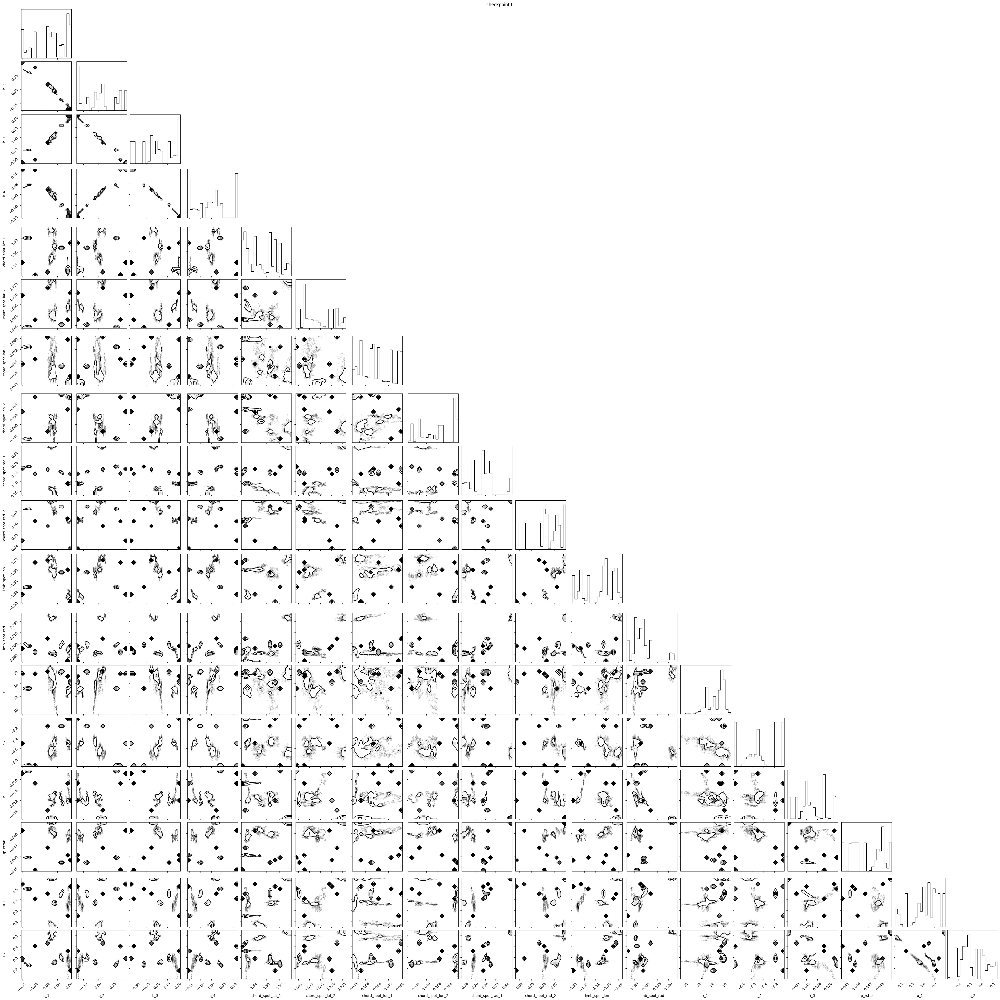

Median parameters from samples:
  b_1: -0.0150
  b_2: 0.0066
  b_3: -0.0035
  b_4: 0.0002
  chord_spot_lat_1: 1.5490
  chord_spot_lat_2: 1.6837
  chord_spot_lon_1: 0.0620
  chord_spot_lon_2: 0.8570
  chord_spot_rad_1: 0.2342
  chord_spot_rad_2: 0.0643
  limb_spot_lon: -1.3030
  limb_spot_rad: 0.2928
  r_1: 15.0151
  r_2: -6.5131
  r_3: 0.0136
  rp_rstar: 0.0468
  u_1: 0.4594
  u_2: 0.3015


/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: divide by zero encountered in scalar divide
  (np.log10(x) - min(log_temps)) /
/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: invalid value encountered in scalar divide
  (np.log10(x) - min(log_temps)) /


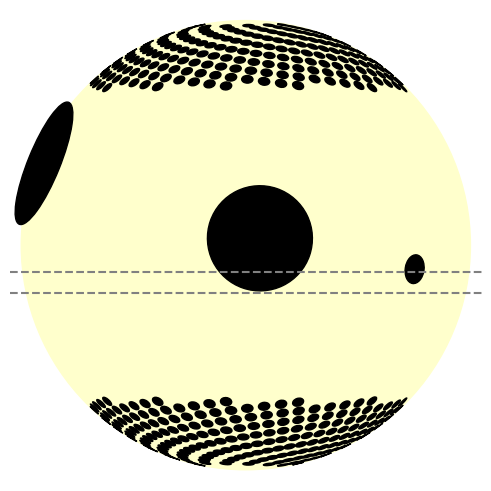

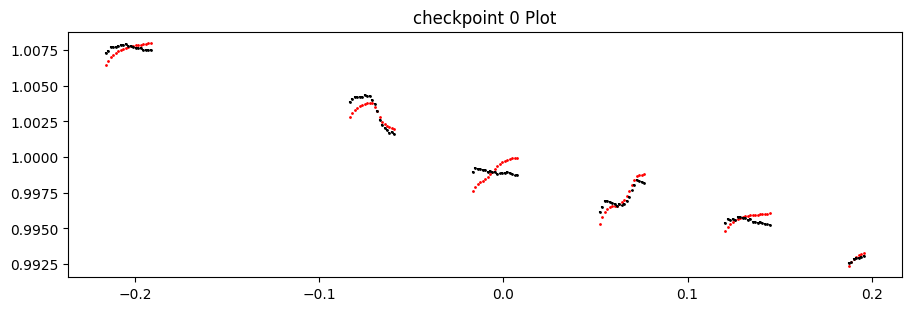

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 1


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


<Figure size 640x480 with 0 Axes>

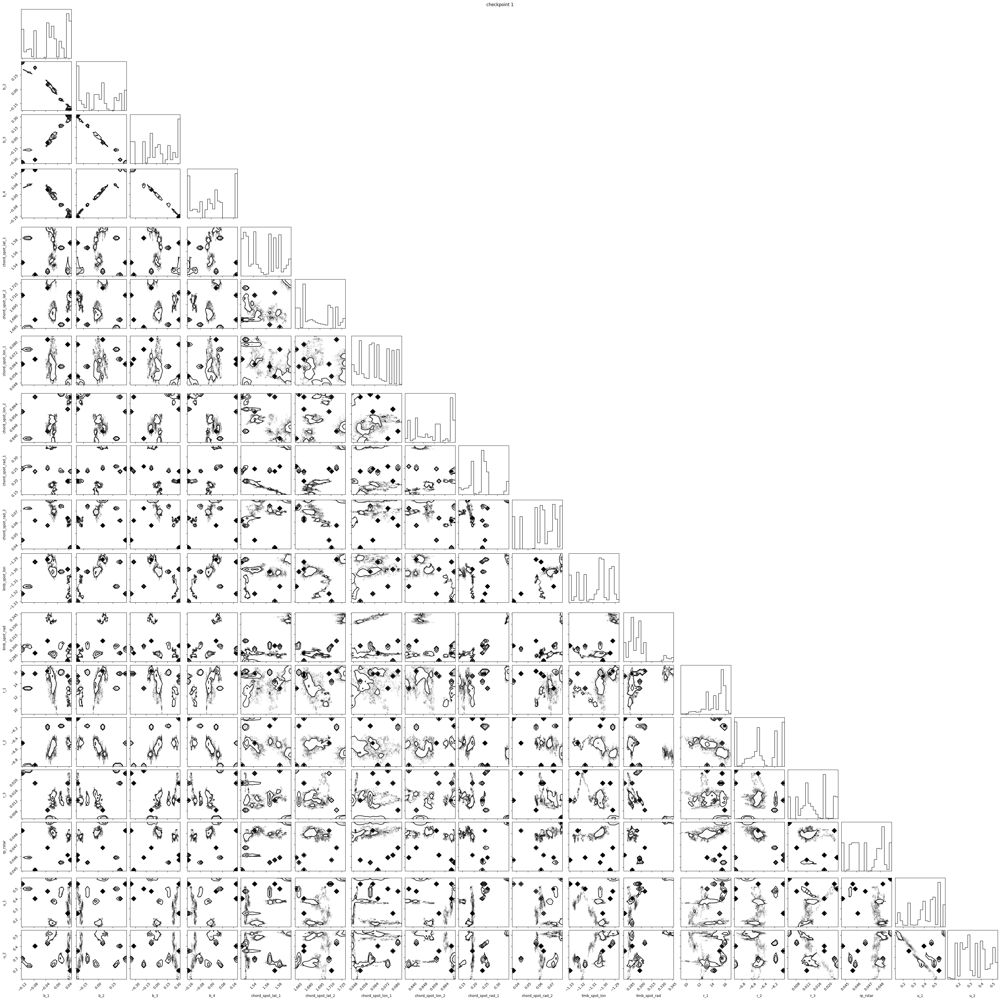

Median parameters from samples:
  b_1: -0.0162
  b_2: 0.0031
  b_3: 0.0043
  b_4: -0.0032
  chord_spot_lat_1: 1.5464
  chord_spot_lat_2: 1.6862
  chord_spot_lon_1: 0.0620
  chord_spot_lon_2: 0.8570
  chord_spot_rad_1: 0.2344
  chord_spot_rad_2: 0.0642
  limb_spot_lon: -1.3029
  limb_spot_rad: 0.2927
  r_1: 15.0109
  r_2: -6.5133
  r_3: 0.0133
  rp_rstar: 0.0468
  u_1: 0.4601
  u_2: 0.3259


/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: divide by zero encountered in scalar divide
  (np.log10(x) - min(log_temps)) /
/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: invalid value encountered in scalar divide
  (np.log10(x) - min(log_temps)) /


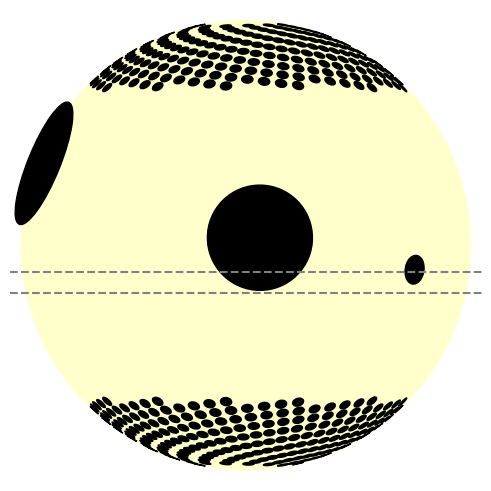

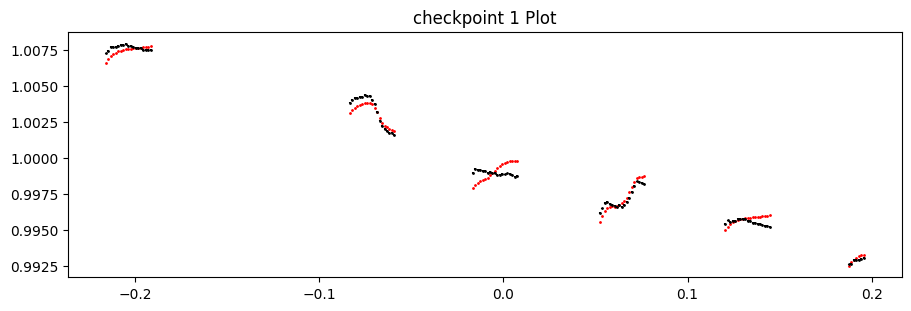

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 2


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


<Figure size 640x480 with 0 Axes>

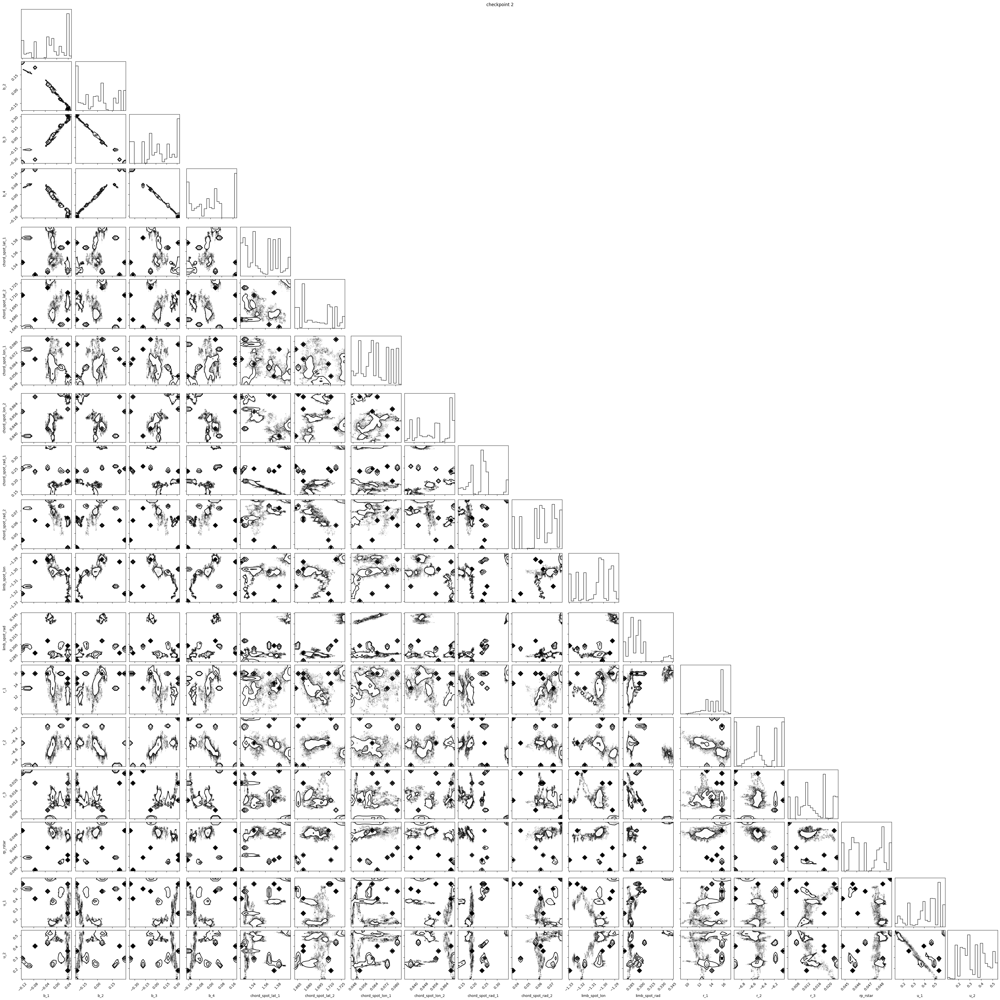

Median parameters from samples:
  b_1: -0.0154
  b_2: -0.0047
  b_3: 0.0151
  b_4: -0.0090
  chord_spot_lat_1: 1.5471
  chord_spot_lat_2: 1.6883
  chord_spot_lon_1: 0.0624
  chord_spot_lon_2: 0.8570
  chord_spot_rad_1: 0.2342
  chord_spot_rad_2: 0.0642
  limb_spot_lon: -1.3032
  limb_spot_rad: 0.2927
  r_1: 15.0067
  r_2: -6.5125
  r_3: 0.0133
  rp_rstar: 0.0468
  u_1: 0.4591
  u_2: 0.3345


/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: divide by zero encountered in scalar divide
  (np.log10(x) - min(log_temps)) /
/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: invalid value encountered in scalar divide
  (np.log10(x) - min(log_temps)) /


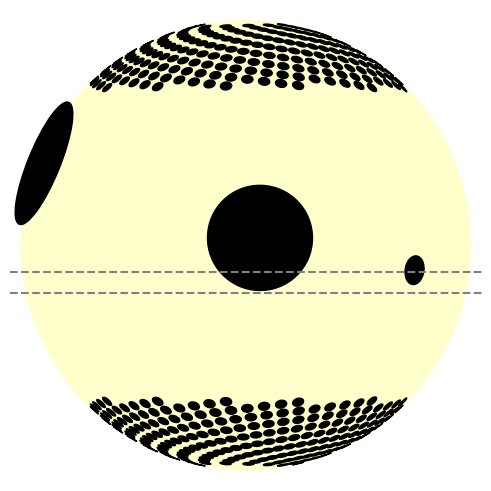

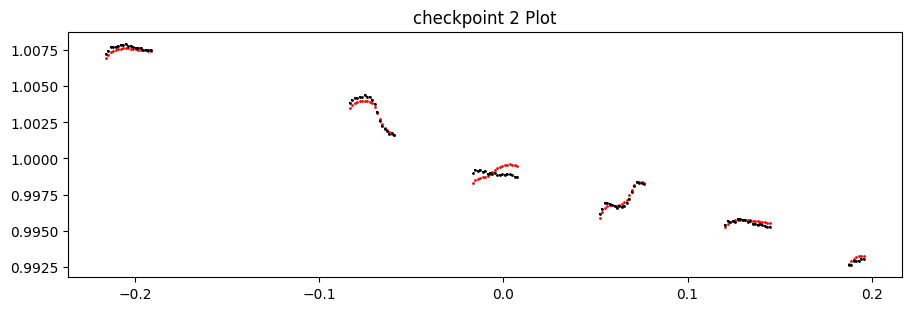

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 3


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


<Figure size 640x480 with 0 Axes>

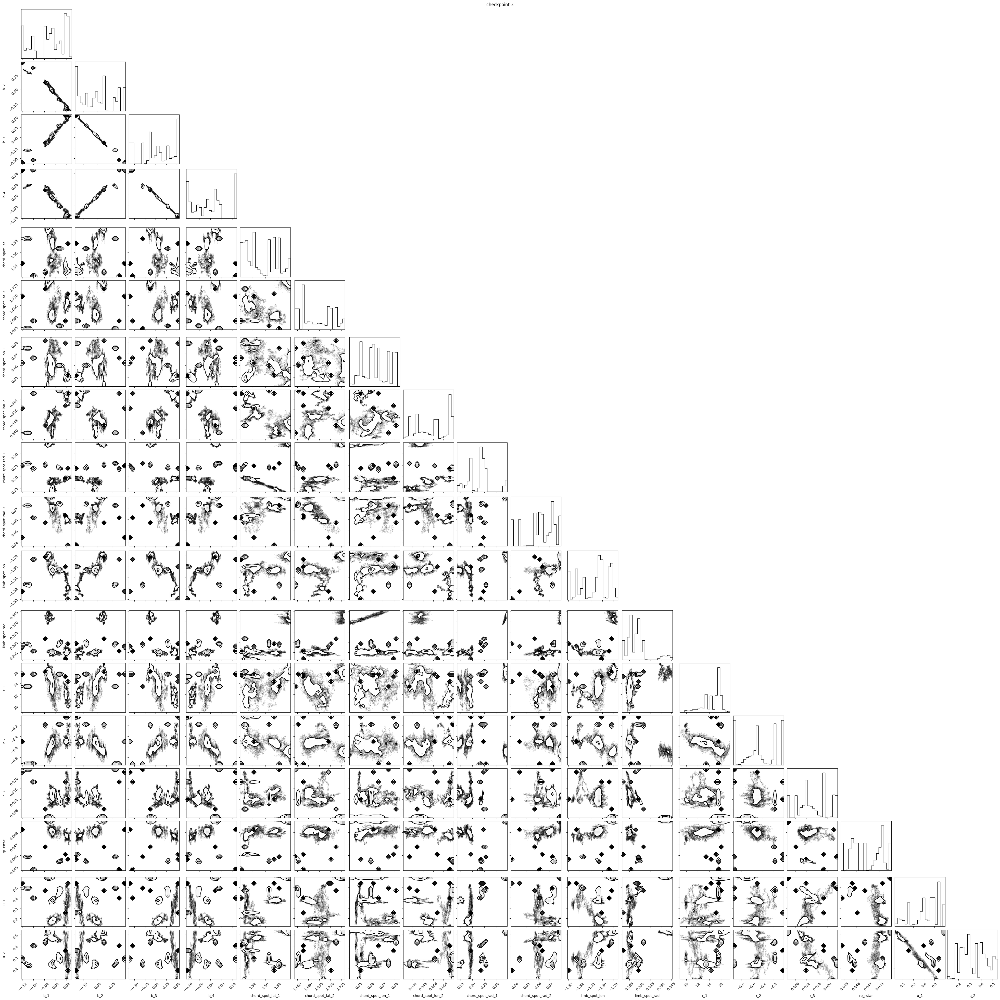

Median parameters from samples:
  b_1: -0.0148
  b_2: -0.0089
  b_3: 0.0211
  b_4: -0.0120
  chord_spot_lat_1: 1.5463
  chord_spot_lat_2: 1.6887
  chord_spot_lon_1: 0.0621
  chord_spot_lon_2: 0.8570
  chord_spot_rad_1: 0.2343
  chord_spot_rad_2: 0.0642
  limb_spot_lon: -1.3034
  limb_spot_rad: 0.2927
  r_1: 15.0108
  r_2: -6.5119
  r_3: 0.0136
  rp_rstar: 0.0468
  u_1: 0.4595
  u_2: 0.3233


/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: divide by zero encountered in scalar divide
  (np.log10(x) - min(log_temps)) /
/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: invalid value encountered in scalar divide
  (np.log10(x) - min(log_temps)) /


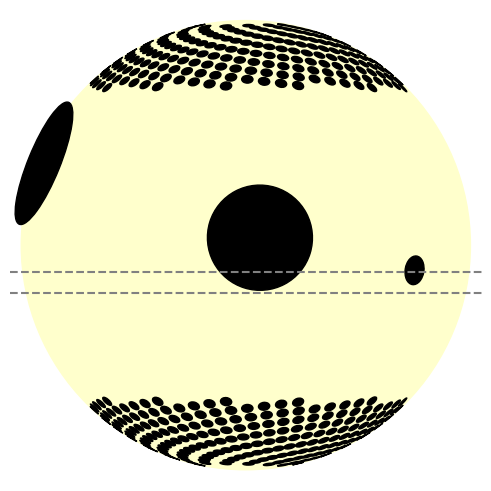

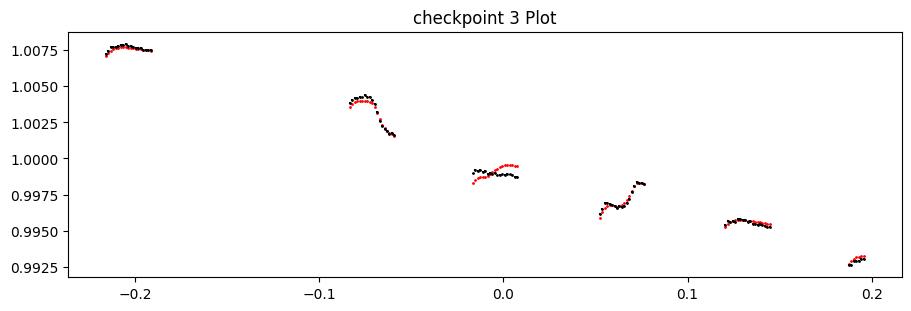

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 4


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


<Figure size 640x480 with 0 Axes>

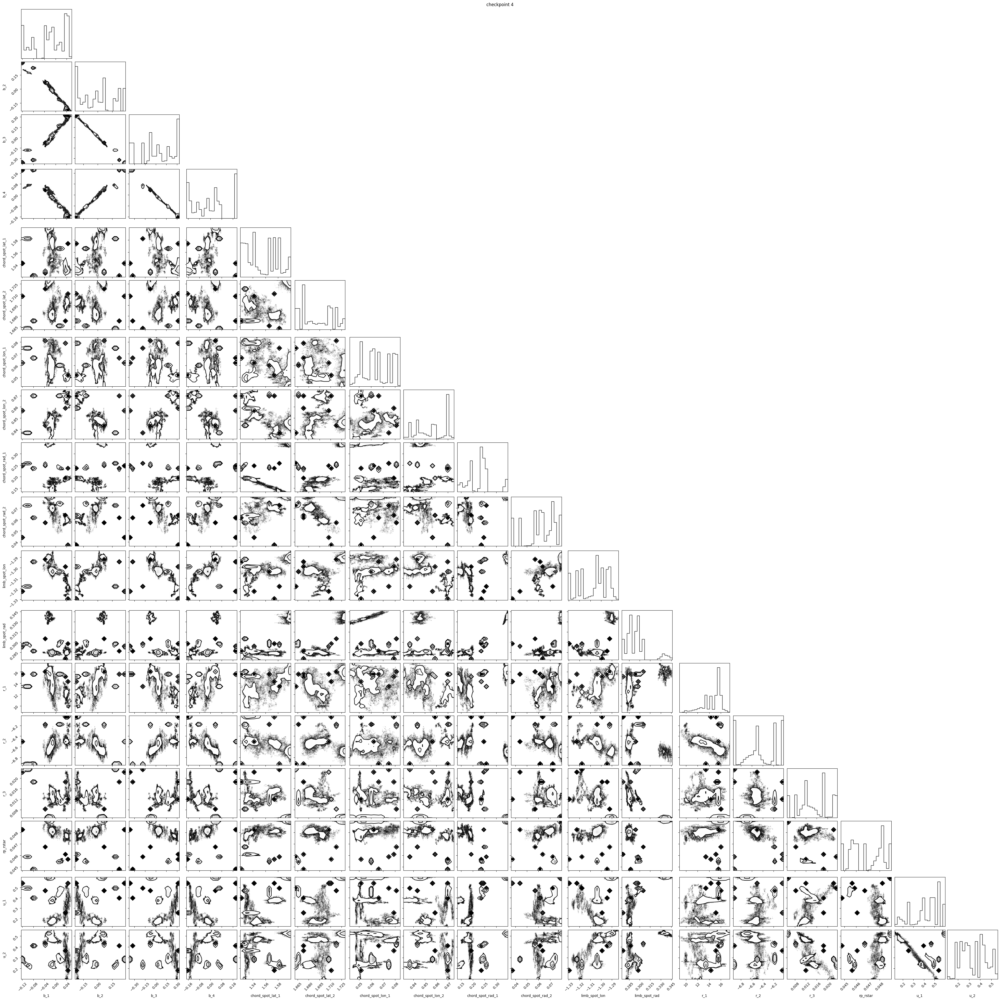

Median parameters from samples:
  b_1: -0.0150
  b_2: -0.0074
  b_3: 0.0199
  b_4: -0.0114
  chord_spot_lat_1: 1.5478
  chord_spot_lat_2: 1.6891
  chord_spot_lon_1: 0.0621
  chord_spot_lon_2: 0.8570
  chord_spot_rad_1: 0.2346
  chord_spot_rad_2: 0.0642
  limb_spot_lon: -1.3032
  limb_spot_rad: 0.2928
  r_1: 15.0165
  r_2: -6.5127
  r_3: 0.0137
  rp_rstar: 0.0468
  u_1: 0.4598
  u_2: 0.3271


/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: divide by zero encountered in scalar divide
  (np.log10(x) - min(log_temps)) /
/Users/will/fleck/fleck/jax.py:693: RuntimeWarning: invalid value encountered in scalar divide
  (np.log10(x) - min(log_temps)) /


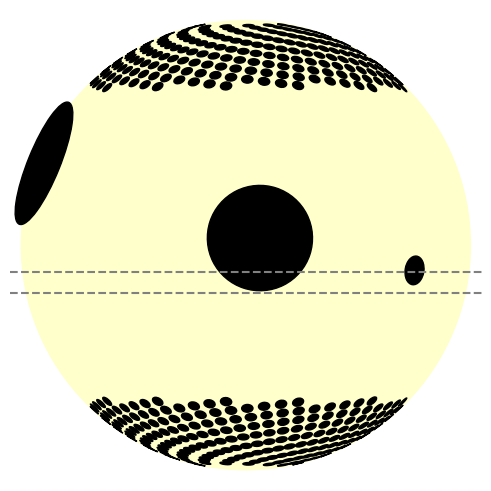

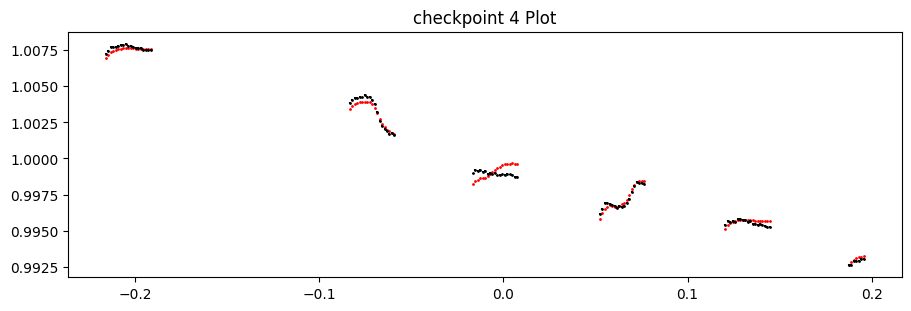

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
n_temps = 2
n_spots = len(initial_lats)
n_warmup = 1_000
n_samples = 10_000
n_chains = 11
n_check=10

model_designation = f'{visit}_{n_samples}samples_{n_chains}chains_{n_spots}spots_whitelight_final'

rng_key = PRNGKey(42)

sampler = NUTS(
    numpyro_model,
    dense_mass=False
)
mcmc = MCMCWithCheckpoints(
    sampler, 
    num_warmup=n_warmup, 
    num_samples=n_samples,
    num_chains=n_chains
)

mcmc.run_checkpoints(rng_key, n_checkpoints=n_check, on_checkpoint=post_batch_viz_save)

In [ ]:
mcmc.print_summary()                                                                        

result = arviz.from_numpyro(mcmc)

In [ ]:
'Save the result'
result.to_netcdf(f'../data/samples/{model_designation}')
'Print the summary'
arviz.summary(result)

In [ ]:
'Make a corner plot'
corner.corner(
    result, 
    # var_names=['~offset_G102',
    #                    r'~$\beta_{\rm G102}$',
    #                    r'~$\beta_{\rm G141}$',
    #                    r'~$\sigma_{\rm conv}$'],
    # quiet=True, 
);
plt.savefig(f'../figs/{model_designation}_corner.png',dpi=200)

'Examine the Leave-One-Out (LOO) summary'
loo = arviz.loo(result, pointwise=True)
loo

## Print and plot the MEDIAN parameter results

In [ ]:
final_median_params = arviz.summary(result,stat_focus='median')['median']

final_lc_model, final_star = plot_results(final_median_params)

final_star.plot_star(
    t0=final_median_params.get('t_0', default_params['t_0']),
    rp=final_median_params.get('rp_rstar', default_params['rp_rstar']),
    a=final_median_params.get('a_rstar', default_params['a_rstar']),
    inclination=np.radians(89.5),
    ecc=final_median_params.get('ecc', default_params['ecc']),
)

plt.figure(figsize=(9,3))
plt.errorbar(time_from_T0,normalized_data_flux,
             yerr=(10**final_median_params.get('beta', default_params['beta']))*normalized_relative_err,
             fmt='o',ms=1,color='k')
plt.scatter(time_from_T0,final_lc_model,s=1,color='r')    
plt.title(f'Median LC Plot')
plt.savefig(f'../figs/Final_{model_designation}_lc_model.png',dpi=200)
plt.show()
plt.clf()

## Print and plot the Maximum Likelihood Estimate results

In [ ]:
all_vars = result.groups()
print("Available groups:", all_vars)

if 'posterior' in all_vars:
    posterior_vars = list(result.posterior.data_vars.keys())
    print("Posterior parameters:", posterior_vars)
    
    map_estimates = {}
    for param in posterior_vars:
        # Flatten all chains and draws
        samples = result.posterior[param].values.flatten()
        
        # Use KDE to find mode (true MAP)
        kde = gaussian_kde(samples)
        n_points = 5000
        x = np.linspace(samples.min(), samples.max(), n_points)
        density = kde(x)
        map_value = x[density.argmax()]
        map_estimates[param] = map_value
        
        print(f"{param}: {map_value:.4f}")

mle_lc_model, mle_star = plot_results(map_estimates)

mle_star.plot_star(
    t0=map_estimates.get('t_0', default_params['t_0']),
    rp=map_estimates.get('rp_rstar', default_params['rp_rstar']),
    a=map_estimates.get('a_rstar', default_params['a_rstar']),
    inclination=np.radians(89.5),
    ecc=map_estimates.get('ecc', default_params['ecc']),
)

plt.figure(figsize=(9,3))
plt.errorbar(time_from_T0,normalized_data_flux,
             yerr=(10**map_estimates.get('beta', default_params['beta']))*normalized_relative_err,
             fmt='o',ms=1,color='k')
plt.scatter(time_from_T0,mle_lc_model,s=1,color='r')    
plt.title(f'Final LC Plot')
plt.savefig(f'../figs/Final_{model_designation}_lc_model.png',dpi=200)
plt.show()
plt.clf()